In [43]:
"""
Notebook con analisis de presencia de caos otros indicadores para datos SARS-CoV-II en UK. Principalmente se ocupa la librería "tseriesChaos" de R para obtener los resultados. Este notebook sirve netamente para visualizar y analisar los datos obtenidos de R.

- Dimension de Inmersion d (Flase Nearest Neihjbours Test. Kennel et al 1992)
- Tiempo de retardo (delay) tau
- Ventana de Theiler (ACF/ Time-Space Separation)
- Dimension de Correlacion (Grassberger and Procaccia Algorithm 1985b, Takens Estimator 1985)

"""

'\nNotebook con analisis de presencia de caos otros indicadores para datos SARS-CoV-II en UK. Principalmente se ocupa la librería "tseriesChaos" de R para obtener los resultados. Este notebook sirve netamente para visualizar y analisar los datos obtenidos de R.\n\n- Dimension de Inmersion d (Flase Nearest Neihjbours Test. Kennel et al 1992)\n- Tiempo de retardo (delay) tau\n- Ventana de Theiler (ACF/ Time-Space Separation)\n- Dimension de Correlacion (Grassberger and Procaccia Algorithm 1985b, Takens Estimator 1985)\n\n'

In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import statsmodels.api as sm
from matplotlib import animation

sns.set()


from nolitsa import data, dimension, delay, noise, lyapunov
from mpl_toolkits.mplot3d import Axes3D
from statsmodels.tsa.filters.hp_filter import hpfilter

from sklearn.metrics import mutual_info_score
from scipy.stats import chi2_contingency

# UK

### Depuramos los datos de la serie de tiempo relacionada a UK, obtenida a través de [https://coronavirus.data.gov.uk]

In [45]:
data_uk_cases = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Modelamietno Matematico\Chaos-Presence-SARS-CoV-II\data_bruto\data_cases_2021-Jan-10-UK.csv', parse_dates=['date'], index_col='date')


data_uk_deaths = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Modelamietno Matematico\Chaos-Presence-SARS-CoV-II\data_bruto\data_deaths_2021-Jan-10-UK.csv', parse_dates=['date'], index_col='date')

UK_cases = data_uk_cases['newCasesBySpecimenDate']
UK_deaths = data_uk_deaths['newDeaths28DaysByDeathDate']

UK_cases = UK_cases.iloc[::-1]
UK_deaths = UK_deaths.iloc[::-1]


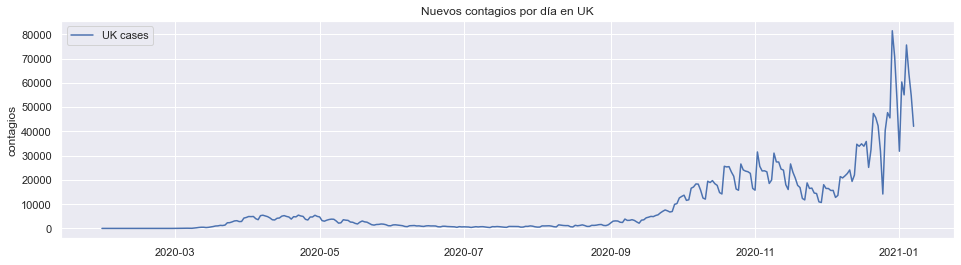

In [46]:
plt.figure(0, figsize=(16,4))
plt.plot(UK_cases, label='UK cases')
plt.title('Nuevos contagios por día en UK')
plt.ylabel('contagios')
plt.legend()
plt.show()

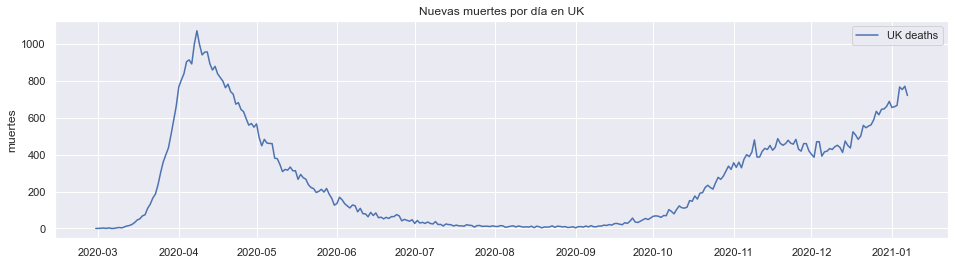

In [47]:
plt.figure(1, figsize=(16,4))
plt.clf()
plt.plot(UK_deaths, label='UK deaths')
plt.title('Nuevas muertes por día en UK')
plt.ylabel('muertes')
plt.legend()
plt.show()

In [49]:
UK_cases = np.array(UK_cases)

UK_deaths  = np.array(UK_deaths)

UK_cases = UK_cases / np.max(UK_cases)

UK_deaths  = UK_deaths / np.max(UK_deaths)
UK_deaths = UK_deaths / np.max(UK_deaths)

# np.savetxt('UK_cases', UK_cases, delimiter=',')

# np.savetxt('UK_deaths', UK_deaths, delimiter=',')


### Obtenemos el Promedio de Informacion Mutua (AMI) mediante R

In [50]:
AMI_UK = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Modelamietno Matematico\Chaos-Presence-SARS-CoV-II\data_para_R\AMI_UK.csv')
AMI_UK.head()

,mutual_UK_cases,mutual_UK_deaths
0,1.371424,2.163698
1,0.964864,1.535530
2,0.871595,1.396015
3,0.801101,1.329998
4,0.769765,1.260984


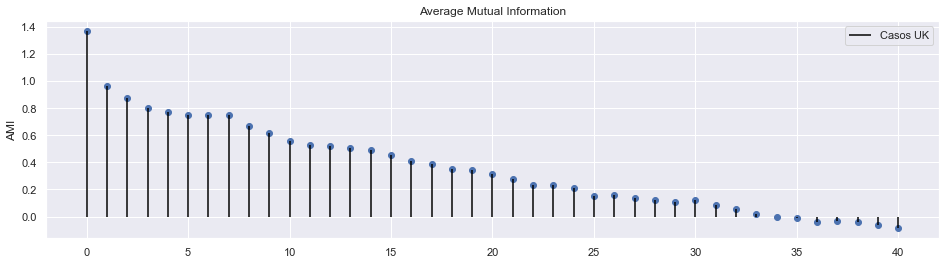

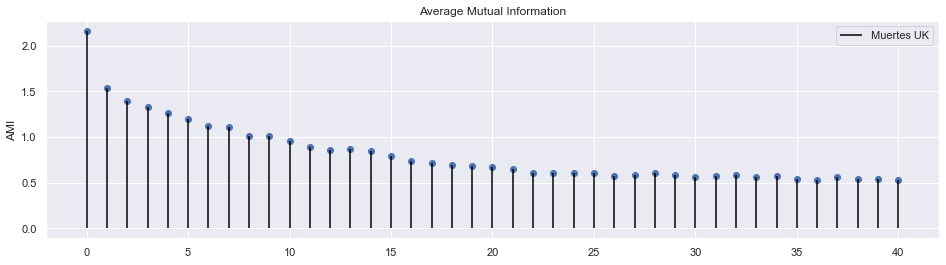

In [51]:
AMI_UK_cases = np.array(AMI_UK['mutual_UK_cases'])

AMI_UK_deaths = np.array(AMI_UK['mutual_UK_deaths'])

plt.figure(2, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_UK_cases, label='Casos UK', color='black')
plt.scatter(np.arange(41), AMI_UK_cases, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(3, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_UK_deaths, label='Muertes UK', color='black')
plt.scatter(np.arange(41), AMI_UK_deaths, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()


In [52]:
delay_UK_cases = []

delay_UK_deaths = []

for i in range(len(AMI_UK_cases)-2):
    if AMI_UK_cases[i] > AMI_UK_cases[i+1] and AMI_UK_cases[i+2] > AMI_UK_cases[i+1]:
        delay_UK_cases.append(i+1)

for i in range(len(AMI_UK_deaths)-2):
    if AMI_UK_deaths[i] > AMI_UK_deaths[i+1] and AMI_UK_deaths[i+2] > AMI_UK_deaths[i+1]:
        delay_UK_deaths.append(i+1)

print('Tiempos de Retardo para UK casos:', delay_UK_cases)
print('Tiempos de Retardo para UK muertes:', delay_UK_deaths)


Tiempos de Retardo para UK casos: [5, 25, 29, 36]
Tiempos de Retardo para UK muertes: [8, 12, 22, 26, 30, 33, 36, 38]


- tau UK cases = 5, 25

- tau UK deaths = 8, 12

## Obtenemos mediante graficos de separacion espacio-temporales los siguientes Theiler Windows

- tw UK cases = 13 

- tw UK deaths = error (ponemos 13)

## Para tseriesChaos obtenemos dimensión de inmersión 

- dim FNN UK cases = 3
- dim FNN UK deaths = 4


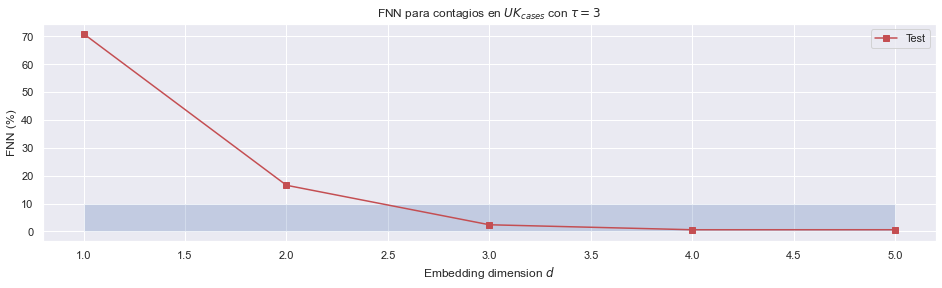

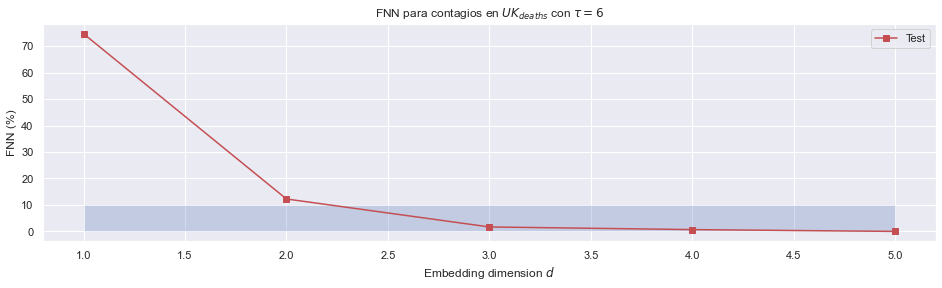

In [40]:
dim = np.arange(1, 6)
f1, f2, f3 = dimension.fnn(UK_cases, tau=3, dim=dim, window=13) #, metric='chebyshev')

plt.figure(4, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $UK_{cases}$ con $\\tau=3$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(UK_deaths, tau=6, dim=dim, window=13) #, metric='chebyshev')

plt.figure(5, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $UK_{deaths}$ con $\\tau=6$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()


### Reconstruimos el atractor

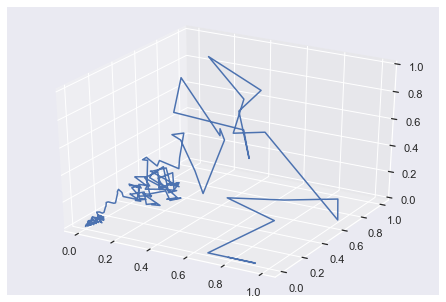

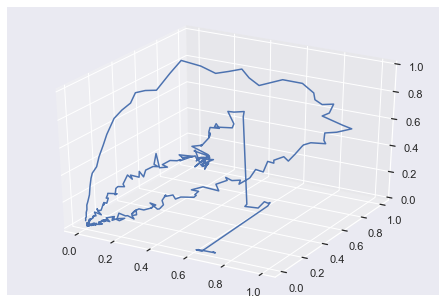

In [54]:
tau_UK_cases = 5

figg = plt.figure(6)#, figsize=(8, 7))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(UK_cases)[:-2].flatten()
data_lag1 = np.roll(np.array(UK_cases), -tau_UK_cases)[:-2].flatten()
data_lag2 = np.roll(np.array(UK_cases), -2 * tau_UK_cases)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_UK_deaths = 8

figg = plt.figure(7)#, figsize=(8, 7))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(UK_deaths)[:-2].flatten()
data_lag1 = np.roll(np.array(UK_deaths), -tau_UK_deaths)[:-2].flatten()
data_lag2 = np.roll(np.array(UK_deaths), -2 * tau_UK_deaths)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

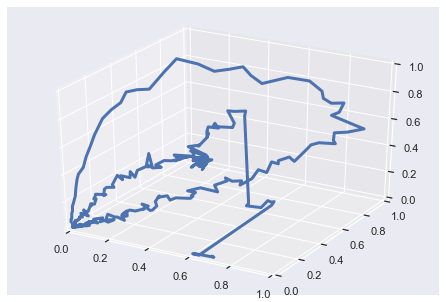

In [58]:
fig = plt.figure(8)
plt.clf()
axes = Axes3D(fig, xlim=(0, 1), ylim=(0, 1), zlim=(0, 1))

line, = axes.plot([], [], [], lw=3)

def init():
    line.set_data([], [], [])
    return line, 

def animate(i):
    X = np.array(UK_deaths)[:-2].flatten()[:i]
    Y = np.roll(np.array(UK_deaths), -tau_UK_deaths)[:-2].flatten()[:i]
    Z = np.roll(np.array(UK_deaths), -2 * tau_UK_deaths)[:-2].flatten()[:i]
    line.set_data(X, Y)
    line.set_3d_properties(Z)
    return line,

anim = animation.FuncAnimation(fig, animate, # init_func=init,
                               frames=314, interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_jshtml())

### Calculemos el Maximo Coeficiente del Exponente de Lyapunov (MCLE) mediante $\texttt{tseriesChaos}$ de $\texttt{R}$

- series: time series.
- m: embedding dimension.
- d: time delay.
- t: Theiler window. Points separated by less than t in the series series are excluded from the search for neighbouring points. [Importante para que se tomen vecinos espaciales, y no dados por la dinámica (es decir, temporales)]
- k: number of neighbours considered.
- ref: number of points in series taken into account.
- s: iterations along which the neighbours of each point are followed.
- eps: radius of the ball inside which nearest neighbours are searched for. [Muy importante para que no se considere vecinos a distancias gigantes]

In [60]:
S_nu_UK = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Modelamietno Matematico\Chaos-Presence-SARS-CoV-II\data_para_R\S_nu_UK.csv')
S_nu_UK.head()

,S_nu_UK_cases,S_nu_UK_deaths
0,-5.143908,-3.532591
1,-4.694340,-3.269454
2,-4.530337,-3.285669
3,-4.371029,-3.291303
4,-4.316653,-3.264007


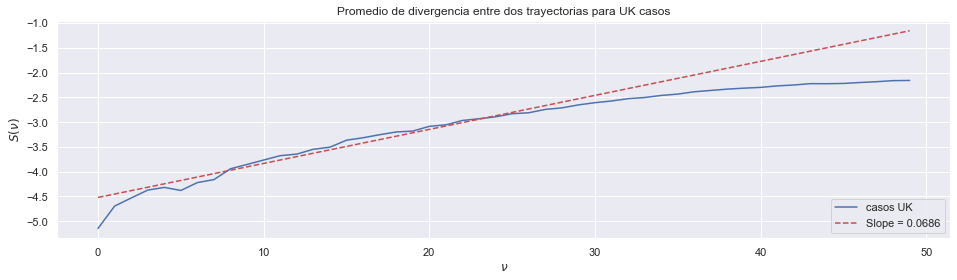

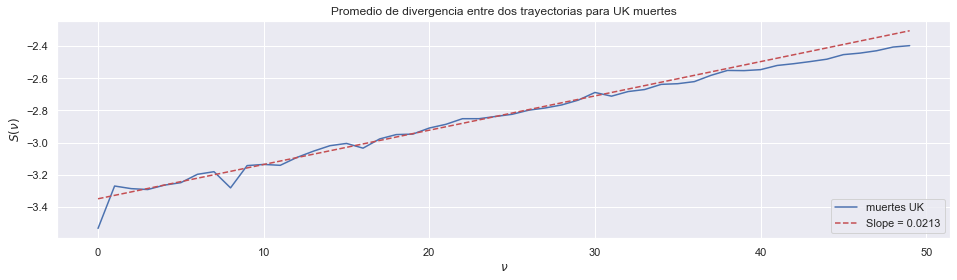

In [62]:
S_nu_UK_cases = S_nu_UK['S_nu_UK_cases']
S_nu_UK_deaths = S_nu_UK['S_nu_UK_deaths']

nu = np.arange(len(S_nu_UK_cases))

MCLE_UK_cases, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[3:30], S_nu_UK_cases[3:30])

plt.figure(9, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_UK_cases, label='casos UK')
plt.plot(nu, MCLE_UK_cases*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_UK_cases), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para UK casos')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.show()

nu = np.arange(len(S_nu_UK_deaths))

MCLE_UK_deaths, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[5:33], S_nu_UK_deaths[5:33])

plt.figure(10, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_UK_deaths, label='muertes UK')
plt.plot(nu, MCLE_UK_deaths*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_UK_deaths), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para UK muertes')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.show()

In [63]:
data = {'': ['UK casos', 'UK muertes'], 'MCLE': 365*np.round([MCLE_UK_cases, MCLE_UK_deaths], 5),'dim inmersion':[3, 4], 'delay': [5, 8], 'tw':[13, 13]}
NN = pd.DataFrame(data)
NN

,,MCLE,dim inmersion,delay,tw
0,UK casos,25.04265,3,5,13
1,UK muertes,7.76720,4,8,13
